<a href="https://colab.research.google.com/github/VineetSivadasan/houses/blob/main/sentiment_analysis_Azure.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [244]:
  import numpy as np
  import numpy.linalg as lg
  import pandas as pd
  from matplotlib import pyplot as plt
  import seaborn as sns
  import string
  from tensorflow import keras
  from tensorflow.keras import layers
  import tensorflow as tf
  import os
  import re
  import tensorflow_hub as hub

In [245]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [246]:
module_url = "https://tfhub.dev/google/universal-sentence-encoder/4"
embedder = hub.load(module_url)

In [269]:
class K_Means:
  def __init__(self,k=12, distance_func = Distance, beta=None):
    self.k=k
    self.distance_func=distance_func
    self.beta =beta

  def Fit(self,X,iterations=6):
    indices = np.arange(X.shape[0])
    sample_indices=np.random.choice(indices, size=self.k, replace=False)
    self.means=X[sample_indices]

    for i in range(iterations):
      y_hat = self.Predict(X)
      self.means=[]
      for j in range(self.k):
        mean=np.mean(X[y_hat==j], axis=0)
        self.means.append(mean)
      self.means=np.vstack(self.means)

    y_hat=self.Predict(X)
    plt.scatter(X[:,0],X[:,1], c=y_hat, s=2)
    plt.scatter(self.means[:,0], self.means[:,1], c='k', s=4)

    return y_hat

  def Predict(self,X):
    dist = self.distance_func(X,self.means,self.beta)
    y_hat = np.argmin(dist,axis=1)
    return y_hat

In [270]:
def Responsibility(X,means,beta=1e-3,*args,**kwargs):
  diff=[]
  responsibilities=[]

  for mean in means:
    diff =X -mean
    dist =(np.sum(diff ** 2,axis=1,keepdims=True))

    numerator= np.exp(-beta*dist)
    denominator=np.sum(numerator)
    responsibility=-numerator/denominator

    responsibilities.append(responsibility)
  return np.hstack(responsibilities)

In [271]:
def TextPreProcess(sentence):

  text = sentence.lower()
  text_p="".join([char for char in text if char not in string.punctuation])
  clean_sentence = re.sub(r'http\s+','',text_p)

  return clean_sentence

In [272]:
def embed(sentence):
  sentence_in =[sentence]
  return embedder(sentence_in)

In [273]:
def data_load(filename):
  data=pd.read_csv(filename, header=0, encoding= 'iso=8859-1')
  X= data.Tweet
  return X

In [274]:
def LoadVectors(X):
  Dict_of_Sent =dict()
  for i in range(len(X)):
    Dict_of_Sent[i] ={"Sentence":X[i], "vector": embed(TextPreProcess(X[i]))}
  return Dict_of_Sent

In [275]:
X=data_load('gdrive/MyDrive/Colab Notebooks/data_elonmusk2.csv')

In [276]:
X

0       @MeltingIce Assuming max acceleration of 2 to ...
1       RT @SpaceX: BFR is capable of transporting sat...
2                                          @bigajm Yup :)
3                          Part 2 https://t.co/8Fvu57muhM
4       Fly to most places on Earth in under 30 mins a...
                              ...                        
3213    @YOUSRC Amos's article was fair, but his edito...
3214    These articles in Space News describe why Aria...
3215    Was misquoted by BBC as saying Europe's rocket...
3216    Just returned from a trip to London and Oxford...
3217    RT @Jon_Favreau: My Model S just arrived and I...
Name: Tweet, Length: 3218, dtype: object

In [277]:
MyNLP_Dictionary = LoadVectors(X)

In [278]:
MyNLP_Dictionary

{0: {'Sentence': "@MeltingIce Assuming max acceleration of 2 to 3 g's, but in a comfortable direction. Will feel like a mild to moder? https://t.co/fpjmEgrHfC",
  'vector': <tf.Tensor: shape=(1, 512), dtype=float32, numpy=
  array([[-0.01513222, -0.05498794, -0.01862379, -0.0029096 ,  0.04367044,
          -0.05171072, -0.02505733, -0.05957022,  0.08424001,  0.08699163,
          -0.0350704 ,  0.02940722, -0.05085945,  0.06859094,  0.04034457,
          -0.03770513,  0.02886639, -0.02395553,  0.08151993,  0.05657995,
           0.02581368, -0.07723982,  0.06286799, -0.01813295,  0.03828338,
           0.0428848 ,  0.00153386, -0.03310398, -0.03540617,  0.03706887,
           0.04740938, -0.03294313,  0.05590165, -0.01068555,  0.02896808,
           0.04013834,  0.07322927,  0.0627121 , -0.05588812, -0.01729072,
          -0.01377365,  0.06460596, -0.00728797, -0.01119483,  0.00121944,
          -0.01198301,  0.03394846, -0.01444509,  0.01007126,  0.02252264,
           0.00862289, -0.0

In [279]:
vector_tweets=[]
for i in range(len(X)):
  vector_tweets.append(np.hstack(MyNLP_Dictionary[i]["vector"].numpy()))
vector_tweets = np.vstack(vector_tweets)

In [280]:
vector_tweets

array([[-0.01513222, -0.05498794, -0.01862379, ...,  0.04403965,
        -0.01092466,  0.00471831],
       [ 0.01734015, -0.06106213, -0.06993027, ...,  0.02043619,
        -0.01934779, -0.01334572],
       [ 0.04200516, -0.02571639,  0.00646962, ..., -0.04399165,
         0.00909323, -0.05910819],
       ...,
       [-0.03936957, -0.05778862,  0.00208145, ...,  0.04549709,
        -0.04390396, -0.08201448],
       [ 0.01513504, -0.03059488,  0.00839877, ...,  0.01190012,
        -0.0149893 , -0.0121182 ],
       [ 0.008053  , -0.02514688,  0.00782774, ...,  0.02444937,
         0.04813436, -0.04135374]], dtype=float32)

In [281]:
def Distance(X, means,*args, **kwargs):
  diff=[]
  dists=[]
  for mean in means:
    diff= X-mean
    #dist = np.sqrt(np.sum(diff**2, axis=1, keepdims=True))
    dist = np.sum(diff**2,axis=1, keepdims=True)
    dists.append(dist)
  return np.hstack(dists)

In [282]:
tweetcluster =K_Means(k=12)

array([4, 2, 6, ..., 2, 9, 8])

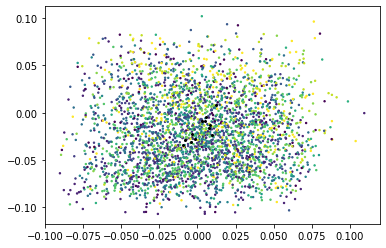

In [283]:
tweetcluster.Fit(vector_tweets)

In [284]:
class K_Means:
  def __init__(self, k=3, distance_func=Distance, beta=None):
    self.k=k
    self.distance_func=distance_func
    self.beta=beta

  def Fit(self,X,iterations=5):
    indices = np.arange(X.shape[0])
    sample_indices = np.random.choice(indices,size=self.k,replace=False)
    self.means = X[sample_indices]

    for i in range(iterations):
      y_hat = self.Predict(X)
      self.means=[]
      for j in range(self.k):
        mean=np.mean(X[y_hat==j], axis=0)
        self.means.append(mean)
      self.means=np.vstack(self.means)

    y_hat=self.Predict(X)
    plt.figure(figsize=(10,7))
    plt.scatter(X[:,0],X[:,1],s=1,c=y_hat)
    plt.scatter(self.means[:,0],self.means[:,1], c='k',s=10)

    return y_hat
  
  def Predict(self,X):
    dist=self.distance_func(X,self.means,self.beta)
    y_hat = np.argmin(dist,axis=1)
    return y_hat


In [285]:
tweetcluster_soft = K_Means(k=12, distance_func=Responsibility, beta=1.6)

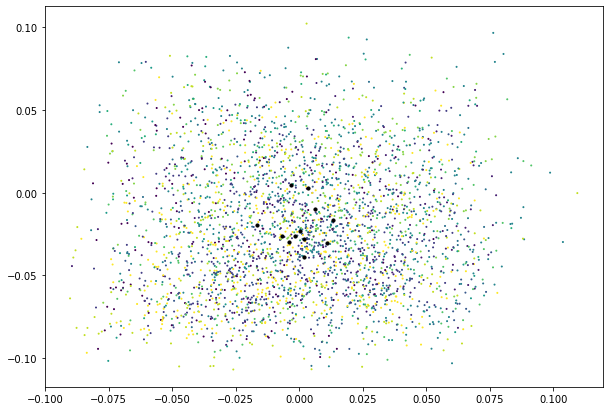

In [286]:
y_hat2=tweetcluster_soft.Fit(vector_tweets, iterations=10)

In [287]:
y_hat2

array([ 0,  2,  5, ...,  2,  9, 11])

In [288]:
for i in range(len(X)):
  print(y_hat2[i]," ",MyNLP_Dictionary[i]['Sentence'])

0   @MeltingIce Assuming max acceleration of 2 to 3 g's, but in a comfortable direction. Will feel like a mild to moder? https://t.co/fpjmEgrHfC
2   RT @SpaceX: BFR is capable of transporting satellites to orbit, crew and cargo to the @Space_Station and completing missions to the Moon an?
5   @bigajm Yup :)
5   Part 2 https://t.co/8Fvu57muhM
0   Fly to most places on Earth in under 30 mins and anywhere in under 60. Cost per seat should be? https://t.co/dGYDdGttYd
2   RT @SpaceX: Supporting the creation of a permanent, self-sustaining human presence on Mars. https://t.co/kCtBLPbSg8 https://t.co/ra6hKsrOcG
7   BFR will take you anywhere on Earth in less than 60 mins https://t.co/HWt9BZ1FI9
3   Mars City
Opposite of Earth. Dawn and dusk sky are blue on Mars and day sky is red. https://t.co/XHcZIdgqnb
7   Moon Base Alpha https://t.co/voY8qEW9kl
8   Will be announcing something really special at today's talk https://t.co/plXTBJY6ia
2   RT @SpaceX: Nine years ago today, Falcon 1 became the f